In [1]:
!pip install -q ultralytics

In [2]:
import os
import random
import shutil
import warnings
import subprocess
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video
import torch

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
sns.set(rc={'axes.facecolor': '#ffe4de'}, style='darkgrid')
dataDir = '/kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8'
trainImagePath = os.path.join(dataDir, 'train', 'images')
yamlfilepath = os.path.join(dataDir, 'data.yaml')

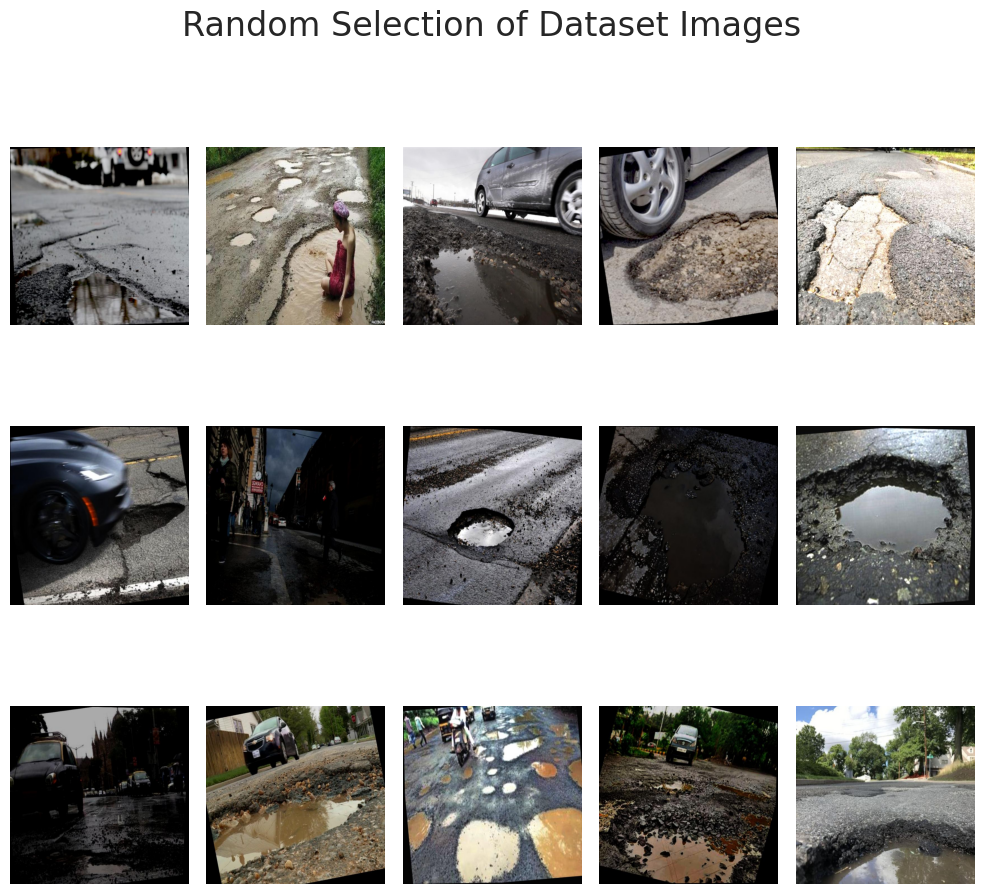

In [4]:
# Display random training images
imagefiles = [f for f in os.listdir(trainImagePath) if f.endswith('.jpg')]
randomImages = random.sample(imagefiles, 15)
plt.figure(figsize=(10, 10))
for i, image_file in enumerate(randomImages):
    image_path = os.path.join(trainImagePath, image_file)
    image = Image.open(image_path)
    plt.subplot(3, 5, i + 1)
    plt.imshow(image)
    plt.axis('off')
plt.suptitle('Random Selection of Dataset Images', fontsize=24)
plt.tight_layout()
plt.show()

In [5]:
model = YOLO('yolov8n-seg.pt')
results = model.train(
    data=yamlfilepath,
    epochs=30,
    imgsz=640,
    batch=32,
    optimizer='auto',
    lr0=0.0001,
    lrf=0.01,
    dropout=0.25,
    device='cuda' if torch.cuda.is_available() else 'cpu',
    seed=42
)

100%|██████████| 6.74M/6.74M [00:00<00:00, 87.1MB/s]


Ultralytics 8.3.155 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.25, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=Tr

100%|██████████| 755k/755k [00:00<00:00, 17.7MB/s]
2025-06-16 12:57:59,483	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2025-06-16 12:58:00,405	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 74.7MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.3±0.2 ms, read: 25.8±6.2 MB/s, size: 67.4 KB)


train: Scanning /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/train/labels... 720 images, 0 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:02<00:00, 289.33it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/train is not writeable, cache not saved.
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 20.7±8.2 MB/s, size: 98.1 KB)


val: Scanning /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid/labels... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 204.30it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid is not writeable, cache not saved.


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/segment/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/30       7.9G      1.509      3.323      2.676      1.473         63        640: 100%|██████████| 23/23 [00:17<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

                   all         60        201    0.00994      0.891      0.206      0.113    0.00939      0.841      0.204      0.106



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/30      7.88G      1.408      2.386      1.791      1.358         62        640: 100%|██████████| 23/23 [00:14<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

                   all         60        201      0.565      0.144      0.185     0.0829      0.568      0.137      0.181     0.0785



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/30      7.88G      1.406      2.383      1.698      1.381         70        640: 100%|██████████| 23/23 [00:13<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

                   all         60        201      0.497      0.274      0.302      0.141      0.516      0.281      0.312      0.142



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/30      7.88G      1.393      2.273      1.603      1.369         91        640: 100%|██████████| 23/23 [00:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

                   all         60        201      0.169      0.249     0.0926     0.0376       0.19      0.204     0.0801     0.0257



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/30      7.87G      1.414      2.298      1.573      1.378         81        640: 100%|██████████| 23/23 [00:13<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

                   all         60        201      0.169      0.179      0.103     0.0431      0.131      0.139     0.0806     0.0242



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/30      7.89G      1.389      2.254      1.463      1.342         69        640: 100%|██████████| 23/23 [00:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

                   all         60        201       0.23      0.343      0.184     0.0713      0.242      0.318      0.166     0.0548



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/30      7.86G      1.398      2.247       1.39      1.347         72        640: 100%|██████████| 23/23 [00:13<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         60        201      0.465      0.428      0.386      0.182      0.476      0.398       0.37      0.167



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/30      7.88G      1.371      2.179      1.333      1.334         72        640: 100%|██████████| 23/23 [00:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

                   all         60        201      0.388      0.448      0.376      0.201      0.392      0.463      0.376      0.188



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/30      7.86G      1.321      2.133      1.218      1.298         65        640: 100%|██████████| 23/23 [00:14<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

                   all         60        201      0.574      0.537      0.536      0.275      0.604       0.57      0.565      0.266



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/30      7.88G      1.265      2.007      1.167      1.255         78        640: 100%|██████████| 23/23 [00:14<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

                   all         60        201       0.67      0.566        0.6      0.333      0.675      0.567       0.59      0.307



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/30      5.65G      1.304      2.081      1.174      1.279         76        640: 100%|██████████| 23/23 [00:14<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         60        201      0.628       0.52      0.545      0.283      0.587      0.487      0.482       0.22



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/30      7.89G      1.265      2.011      1.125      1.261         48        640: 100%|██████████| 23/23 [00:14<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

                   all         60        201      0.568      0.592      0.589      0.335      0.563      0.587      0.578      0.301



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/30      7.89G      1.238      1.998      1.089      1.226         78        640: 100%|██████████| 23/23 [00:13<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         60        201      0.615      0.611      0.614      0.349      0.624      0.612      0.618      0.341



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/30      7.89G      1.214      1.947      1.061      1.237         66        640: 100%|██████████| 23/23 [00:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

                   all         60        201      0.574      0.576      0.556      0.318       0.59      0.587      0.572      0.289



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/30      7.88G      1.188      1.906      1.017      1.214         66        640: 100%|██████████| 23/23 [00:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.69it/s]

                   all         60        201      0.618      0.578      0.594      0.336      0.651      0.622      0.637      0.323



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/30      7.88G       1.17      1.891     0.9827      1.198         55        640: 100%|██████████| 23/23 [00:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         60        201      0.669      0.617      0.621      0.339       0.73      0.607      0.637      0.321



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/30      7.89G      1.165      1.854     0.9515       1.19         75        640: 100%|██████████| 23/23 [00:13<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

                   all         60        201      0.627      0.651      0.646      0.359      0.622      0.646      0.632      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/30      7.88G      1.131      1.829     0.9429      1.183         61        640: 100%|██████████| 23/23 [00:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         60        201      0.768      0.607      0.719      0.427      0.768      0.607      0.714      0.414



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/30      7.88G      1.122      1.793     0.9082      1.188         94        640: 100%|██████████| 23/23 [00:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

                   all         60        201      0.752      0.619      0.682      0.398      0.766      0.633      0.692      0.384



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/30      5.67G      1.084      1.724     0.8639      1.145         62        640: 100%|██████████| 23/23 [00:13<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

                   all         60        201      0.743       0.59      0.695      0.422       0.75      0.597      0.692      0.394


Closing dataloader mosaic
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/30      8.09G      1.095      1.738     0.8291      1.172         38        640: 100%|██████████| 23/23 [00:14<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         60        201      0.613      0.562      0.577      0.327      0.525      0.592      0.539      0.283



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/30       5.6G      1.059      1.677     0.7824       1.16         30        640: 100%|██████████| 23/23 [00:12<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

                   all         60        201       0.67      0.646      0.691      0.429      0.727      0.602      0.691      0.405



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/30       5.6G      1.021      1.617     0.7552      1.125         34        640: 100%|██████████| 23/23 [00:12<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

                   all         60        201      0.758      0.638      0.713      0.419      0.747      0.622      0.695      0.391



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/30       5.6G      1.024      1.618     0.7248       1.12         31        640: 100%|██████████| 23/23 [00:12<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

                   all         60        201      0.766      0.607      0.691      0.421      0.789      0.622      0.714      0.415



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/30       5.6G     0.9843      1.586      0.687      1.105         41        640: 100%|██████████| 23/23 [00:12<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

                   all         60        201      0.687      0.677      0.725      0.433      0.687      0.677       0.72      0.421



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/30       5.6G     0.9643      1.524     0.6564      1.091         34        640: 100%|██████████| 23/23 [00:12<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

                   all         60        201      0.629      0.721       0.71      0.426      0.753      0.637      0.735      0.403



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/30       5.6G     0.9459      1.513     0.6299      1.074         36        640: 100%|██████████| 23/23 [00:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

                   all         60        201      0.688      0.681      0.728      0.458      0.693      0.686      0.727       0.43



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/30       5.6G     0.8973      1.487     0.6018      1.039         24        640: 100%|██████████| 23/23 [00:12<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

                   all         60        201      0.784      0.614      0.735      0.459      0.707      0.692      0.738      0.448



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/30       5.6G     0.8846      1.435     0.5834      1.037         45        640: 100%|██████████| 23/23 [00:12<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

                   all         60        201      0.683      0.697      0.726      0.467      0.755      0.662      0.731      0.447



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/30       5.6G     0.8674      1.439     0.5798      1.029         40        640: 100%|██████████| 23/23 [00:12<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.77it/s]

                   all         60        201      0.744      0.682      0.739       0.47      0.759      0.697      0.742      0.446



30 epochs completed in 0.123 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.8MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.155 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


                   all         60        201      0.745      0.682      0.739       0.47      0.762        0.7      0.741      0.446
Speed: 0.2ms preprocess, 3.1ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/segment/train


In [6]:
bestModelPath = 'runs/segment/train/weights/best.pt'
bestModel = YOLO(bestModelPath)


image 1/1 /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid/images/pic-17-_jpg.rf.0d172b6accedf4c52a3868d9b690d48b.jpg: 640x640 1 Pothole, 7.2ms
Speed: 1.7ms preprocess, 7.2ms inference, 9.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid/images/pic-262-_jpg.rf.02970860794f859699c9f743bc0fd7d1.jpg: 640x640 3 Potholes, 7.2ms
Speed: 1.4ms preprocess, 7.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid/images/pic-60-_jpg.rf.4e715308cc8dc7455b767414cda028ab.jpg: 640x640 3 Potholes, 7.8ms
Speed: 1.5ms preprocess, 7.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid/images/pic-178-_jpg.rf.2e27d006aec1544f1eec88d9170fd6ce.jpg: 640x640 3 Pothole

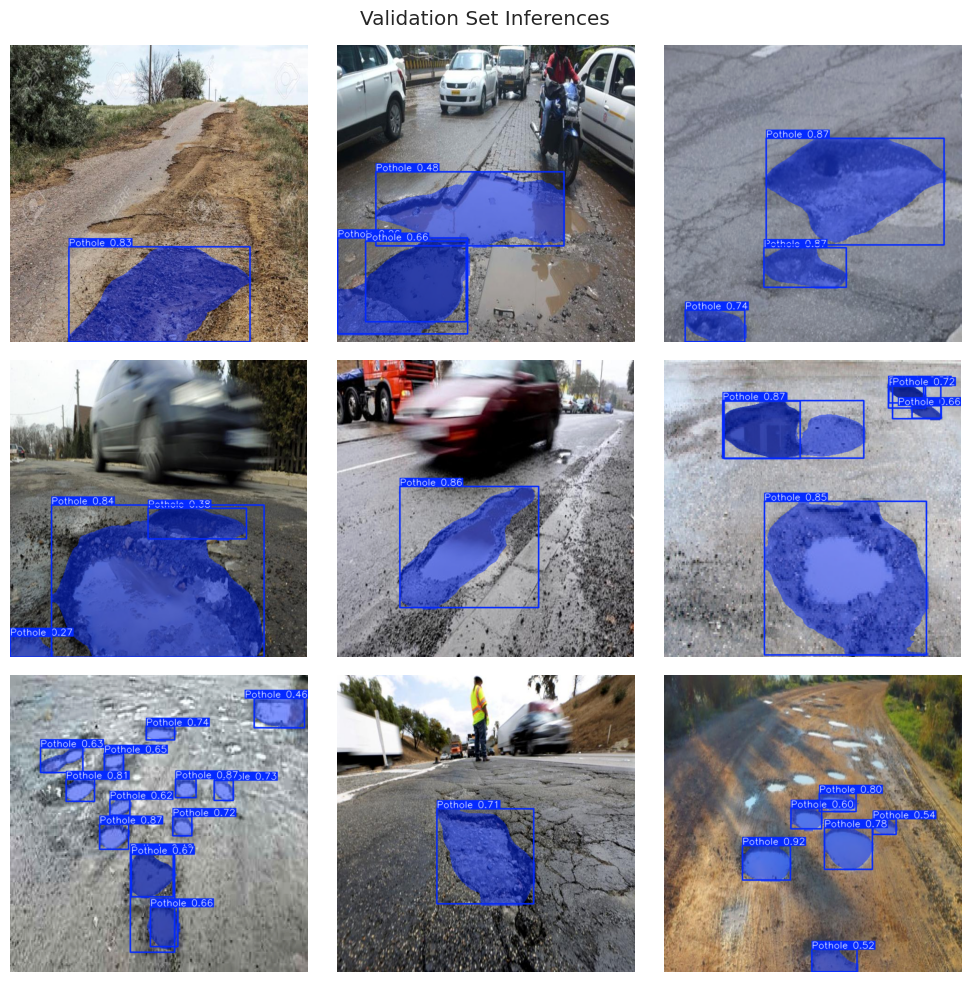

In [7]:
validImagePath = os.path.join(dataDir, 'valid', 'images')
imagefiles = [f for f in os.listdir(validImagePath) if f.endswith('.jpg')]
selectedImages = [imagefiles[i] for i in range(0, len(imagefiles), max(1, len(imagefiles)//9))]

fig, axs = plt.subplots(3, 3, figsize=(10, 10))
fig.suptitle('Validation Set Inferences')
for i, ax in enumerate(axs.flatten()):
    imagePath = os.path.join(validImagePath, selectedImages[i])
    results = bestModel.predict(source=imagePath, imgsz=640)
    annotatedImage = results[0].plot()
    annotatedImageRGB = cv2.cvtColor(annotatedImage, cv2.COLOR_BGR2RGB)
    ax.imshow(annotatedImageRGB)
    ax.axis('off')
plt.tight_layout()
plt.show()

In [8]:
videoPath = '/kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/sample_video.mp4'
results = bestModel.predict(source=videoPath, save=True, imgsz=640)


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/375) /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 61.9ms
video 1/1 (frame 2/375) /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 8.4ms
video 1/1 (frame 3/375) /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 13.3ms
video 1/1 (frame 4/

In [9]:
if os.path.exists('runs/segment/predict/predict.avi'):
    subprocess.call(['ffmpeg', '-y', '-loglevel', 'panic', '-i', 'runs/segment/predict/predict.avi', 'output_video.mp4'])
    Video('output_video.mp4', embed=True, width=960)

In [10]:
def classify_severity(area):
    if area < 1000:
        return 'Low'
    elif area < 5000:
        return 'Medium'
    else:
        return 'High'


In [23]:
def analyze_image(model, image_path):
    results = model.predict(image_path)[0]
    masks = results.masks.data.cpu().numpy() if results.masks else []
    boxes = results.boxes
    confidences = boxes.conf.cpu().numpy() if boxes else []
    areas = [np.sum(mask) for mask in masks]
    severities = [classify_severity(a) for a in areas]
    df = pd.DataFrame({
        "Pothole #": list(range(1, len(areas)+1)),
        "Area": areas,
        "Confidence": confidences,
        "Severity": severities
    })
    return {
        "seg_result": results,
        "summary_df": df,
        "total": len(areas),
        "avg_conf": np.mean(confidences) if len(confidences) > 0 else 0
    }


In [12]:
def analyze_video(model, video_path):
    cap = cv2.VideoCapture(video_path)
    frame_stats = []
    frame_idx = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        results = model.predict(frame, save=False)[0]
        count = len(results.boxes)
        frame_stats.append((frame_idx, count))
        frame_idx += 1
    cap.release()
    df = pd.DataFrame(frame_stats, columns=["Frame", "Pothole Count"])
    return df



In [13]:
# ---------- GRAPH GENERATION CODE ----------
def plot_pothole_area_bar(df):
    plt.figure(figsize=(8,5))
    sns.barplot(data=df, x="Pothole #", y="Area", palette="Blues_d")
    plt.title("Pothole Area Sizes")
    plt.ylabel("Pixel Area")
    plt.xlabel("Pothole")
    plt.tight_layout()
    plt.show()



In [14]:
def plot_severity_pie(df):
    plt.figure(figsize=(6,6))
    severity_counts = df['Severity'].value_counts()
    plt.pie(severity_counts, labels=severity_counts.index, autopct='%1.1f%%', colors=sns.color_palette("Set2"))
    plt.title("Severity Distribution")
    plt.tight_layout()
    plt.show()



In [15]:
def plot_confidence_histogram(df):
    plt.figure(figsize=(7,5))
    sns.histplot(df["Confidence"], bins=10, kde=True, color="coral")
    plt.title("Confidence Score Distribution")
    plt.xlabel("Confidence")
    plt.ylabel("Frequency")
    plt.tight_layout()
    plt.show()



In [16]:
def plot_video_line_chart(video_df):
    plt.figure(figsize=(10,5))
    sns.lineplot(data=video_df, x="Frame", y="Pothole Count", marker="o")
    plt.title("Pothole Detection per Frame")
    plt.xlabel("Frame Number")
    plt.ylabel("Number of Potholes")
    plt.tight_layout()
    plt.show()



image 1/1 /kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid/images/pic-154-_jpg.rf.a9e6b534da24b1c1815902210ab23be9.jpg: 640x640 2 Potholes, 14.4ms
Speed: 2.6ms preprocess, 14.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


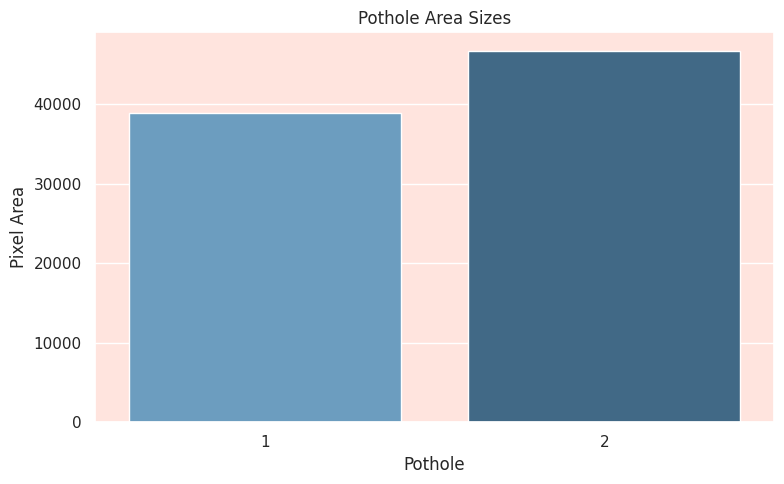

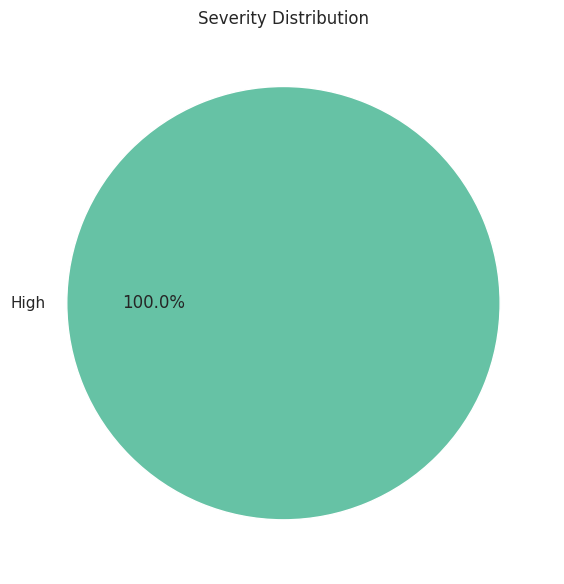

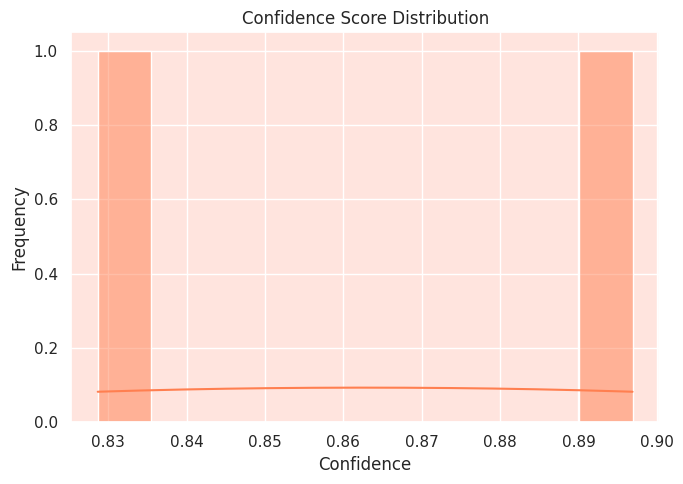

Total potholes detected: 2
Average confidence score: 0.8627853

0: 384x640 3 Potholes, 9.6ms
Speed: 2.2ms preprocess, 9.6ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Potholes, 8.0ms
Speed: 1.6ms preprocess, 8.0ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Potholes, 7.6ms
Speed: 1.9ms preprocess, 7.6ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Potholes, 7.7ms
Speed: 1.6ms preprocess, 7.7ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Potholes, 8.1ms
Speed: 2.0ms preprocess, 8.1ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Potholes, 8.3ms
Speed: 1.8ms preprocess, 8.3ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Potholes, 7.7ms
Speed: 1.9ms preprocess, 7.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Potholes, 7.6ms
Speed: 1.9ms preprocess, 

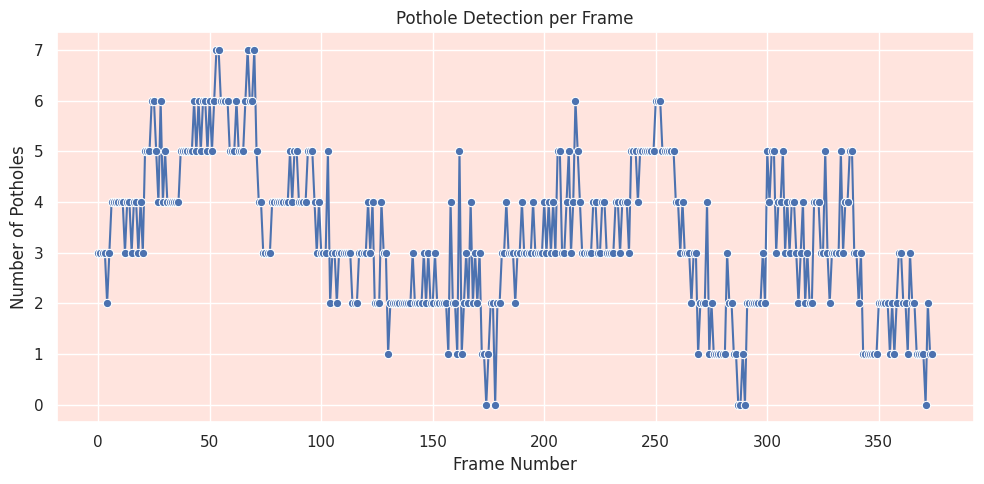

In [24]:
# ---- For Image Inference & Graphs ----
image_result = analyze_image(bestModel, "/kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/valid/images/pic-154-_jpg.rf.a9e6b534da24b1c1815902210ab23be9.jpg")

plot_pothole_area_bar(image_result['summary_df'])
plot_severity_pie(image_result['summary_df'])
plot_confidence_histogram(image_result['summary_df'])

# You can also access total and avg confidence like this:
print("Total potholes detected:", image_result['total'])
print("Average confidence score:", image_result['avg_conf'])

# ---- For Video Inference & Line Chart ----
video_df = analyze_video(bestModel, "/kaggle/input/pothole-image-segmentation-dataset/Pothole_Segmentation_YOLOv8/sample_video.mp4")
plot_video_line_chart(video_df)


In [33]:
from IPython.display import Video as IPyVideo, display

# Get latest prediction folder path
predict_dirs = sorted([d for d in os.listdir('runs/segment') if d.startswith('predict')], reverse=True)
if predict_dirs:
    latest_predict_dir = os.path.join('runs/segment', predict_dirs[0])
    avi_path = os.path.join(latest_predict_dir, 'sample_video.avi')
    
    if os.path.exists(avi_path):
        # Convert to MP4
        mp4_path = os.path.join(latest_predict_dir, 'output_video.mp4')
        subprocess.call(['ffmpeg', '-y', '-loglevel', 'panic', '-i', avi_path, mp4_path])
        
        # Display video
        display(IPyVideo(mp4_path, embed=True, width=960))
    else:
        print(f"AVI file not found at: {avi_path}")
else:
    print("No prediction directories found under runs/segment.")
